# Тестовое задание на вакансию Data Scientist

## 0. Описание задания

В прикрепленном к письму файле 'data.csv' находятся данные: ds - дата и время, x_1, x_2, x_3 - признаки, y - целевая переменная. Задача: 
* Визуализировать временной ряд
* Оценить его стационарность
* Разбить данные на обучающую и валидационную выборку и обосновать разбиение
* Предсказать значение y на тестовой выборке
* Для оценки качества прогноза использовать метрику MAPE, формула для нее приведена ниже
<br>
Все задания выполняются прямо в ноутбуке. **Подсказка: лучше не ограничиваться признаками, которые даны, а придумать свои**. По всем вопросам пишите мне в телеграм @amateurdesperado

In [2]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """ Calculate MAPE. """
    
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [3]:
import sys
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm

import pandas as pd
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error

import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs
from scipy.optimize import minimize

import matplotlib.pyplot as plt

# Загружаем dataset

In [4]:
dataset = pd.read_csv('data-1.csv', index_col=['ds'], parse_dates=['ds'], sep=',')
dataset.shape

(47928, 4)

In [5]:
dataset.head()

,x_1,x_2,x_3,y
ds,,,,
2014-06-01 00:00:00,17.800000,749.000000,54.000000,-1.413909
2014-06-01 01:00:00,16.766667,749.033333,55.333333,-1.709298
2014-06-01 02:00:00,15.733333,749.066667,56.666667,-1.866146
2014-06-01 03:00:00,14.700000,749.100000,58.000000,-1.943523
2014-06-01 04:00:00,14.733333,749.033333,59.333333,-2.037268


In [6]:
dataset.describe()

,x_1,x_2,x_3,y
count,47928.000000,47928.000000,47928.000000,4.792800e+04
mean,6.493843,748.558116,75.050271,6.531258e-17
std,10.391223,7.917536,18.932474,1.000010e+00
min,-34.700000,720.100000,14.000000,-2.344780e+00
25%,-0.700000,743.500000,64.000000,-6.834893e-01
50%,6.266667,748.500000,81.000000,-1.200205e-01
75%,14.600000,753.400000,90.000000,7.620267e-01
max,32.500000,784.566688,100.000000,3.151257e+00


In [7]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import graph_objs as go
init_notebook_mode(connected = True)

def plotly_df(df, title = ''):
    data = []

    for column in df.columns:
        trace = go.Scatter(
            x = df.index,
            y = df[column],
            mode = 'lines',
            name = column
        )
        data.append(trace)

    layout = dict(title = title)
    fig = dict(data = data, layout = layout)
    iplot(fig, show_link=False)

# 1. Визуализируем времянной ряд

In [8]:
plotly_df(dataset, title = 'Визуализизация временного ряда x_1, x_2, x_3, Y')

In [9]:
plotly_df(dataset[dataset.index.year==2018].drop(['x_1', 'x_2','x_3'], axis=1), \
          title = 'Визуализизация временного ряда Y (2018)')

# 2. Оцениваем его стационарность

In [10]:
test = sm.tsa.adfuller(dataset.y)
print ('adf: ', test[0]) 
print ('p-value: ', test[1])
print('Critical values: ', test[4])
if test[0]> test[4]['5%']: 
    print ('есть единичные корни, ряд не стационарен')
else:
    print ('единичных корней нет, ряд стационарен')

adf:  -5.842098574587714
p-value:  3.756569016596238e-07
Critical values:  {'1%': -3.430486607007813, '5%': -2.8616003774327723, '10%': -2.5668021369208995}
единичных корней нет, ряд стационарен


Критерий Дики-Фуллера: p=0.000000


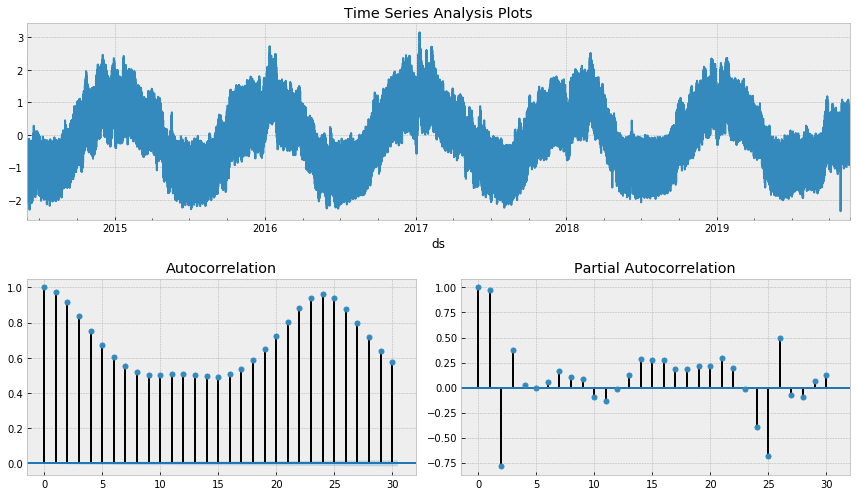

In [11]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        y.plot(ax=ts_ax)
        ts_ax.set_title('Time Series Analysis Plots')
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)

        print("Критерий Дики-Фуллера: p=%f" % sm.tsa.stattools.adfuller(y)[1])

        plt.tight_layout()
    return 

tsplot(dataset.y, lags = 30)

## 3. Извлечение признаков (Feature extraction), Кросс-валидация на временных рядах

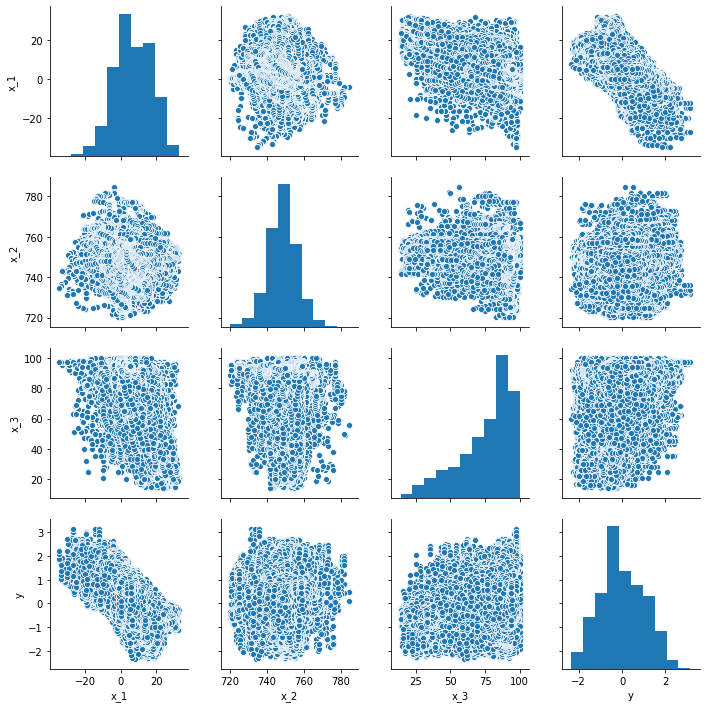

In [12]:
# Визуализация зависимостей в dataset без feature engineering

import seaborn as sns

sns.pairplot(dataset)

Проблема состоит в том, что временной ряд имеет временную структуру, и случайно перемешивать в фолдах значения всего ряда без сохранения этой структуры нельзя, иначе в процессе потеряются все взаимосвязи наблюдений друг с другом. Суть достаточно проста — начинаем обучать модель на небольшом отрезке временного ряда, от начала до некоторого t , делаем прогноз на t + n шагов вперед и считаем ошибку. Далее расширяем обучающую выборку до t+n значения и прогнозируем с t+n до t+2*n , так продолжаем двигать тестовый отрезок ряда до тех пор, пока не упрёмся в последнее доступное наблюдение. В итоге получим столько фолдов, сколько  уместится в промежуток между изначальным обучающим отрезком и всей длиной ряда.

In [13]:
def code_mean(data, cat_feature, real_feature):
    """
    Возвращает словарь, где ключами являются уникальные категории признака cat_feature, 
    а значениями - средние по real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

In [14]:
from sklearn.preprocessing import StandardScaler

def prepareData(data, lag_start=5, lag_end=20, test_size=0.15):

    data = pd.DataFrame(data.copy())
    data.columns = ['x_1', 'x_2','x_3','y']

    # считаем индекс в датафрейме, после которого начинается тестовыый отрезок
    test_index = int(len(data)*(1-test_size))

    # добавляем лаги исходного ряда в качестве признаков
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)

    data.index = pd.to_datetime(data.index)
    data["hour"] = data.index.hour
    data["day"] = data.index.day
    data["weekday"] = data.index.weekday
    data['is_weekend'] = data.weekday.isin([5,6])*1
    data["month"] = data.index.month
    data["year"] = data.index.year

    # считаем средние только по тренировочной части, чтобы избежать лика
    data["day_average"] = list(map(code_mean(data[:test_index], 'day', "y").get, data.day))
    data['weekday_average'] = list(map(code_mean(data[:test_index], 'weekday', "y").get, data.weekday))
    data["hour_average"] = list(map(code_mean(data[:test_index], 'hour', "y").get, data.hour))
    data["month_average"] = list(map(code_mean(data[:test_index], 'month', "y").get, data.month))
    data["year_average"] = list(map(code_mean(data[:test_index], 'year', "y").get, data.year))

    # выкидываем закодированные средними признаки 
    data.drop(["hour", 'day',"weekday", "month","year"], axis=1, inplace=True)

    data = data.dropna()
    data = data.reset_index(drop=True)

    # разбиваем весь датасет на тренировочную и тестовую выборку
    X_train = data.loc[:test_index].drop(["y"], axis=1)
    y_train = data.loc[:test_index]["y"]
    X_test = data.loc[test_index:].drop(["y"], axis=1)
    y_test = data.loc[test_index:]["y"]
    
    # масштабируем признаки
    scaler = StandardScaler()
    scaler.fit(X_train[['x_1', 'x_2','x_3']], y_train)
    X_train[['x_1', 'x_2','x_3']] = scaler.transform(X_train[['x_1', 'x_2','x_3']])
    X_test[['x_1', 'x_2','x_3']] = scaler.transform(X_test[['x_1', 'x_2','x_3']])
    
    return X_train, X_test, y_train, y_test

In [15]:
data = pd.DataFrame(dataset.y)
data.columns = ["y"]

data.index = pd.to_datetime(data.index)
data["hour"] = data.index.hour
data["day"] = data.index.day
data["weekday"] = data.index.weekday
data['is_weekend'] = data.weekday.isin([5,6])*1
data["month"] = data.index.month
data["year"] = data.index.year
data.head()

code_mean(data, 'weekday', "y")

{0: 0.04609383519689173,
 1: 0.09312693556406054,
 2: 0.10581738500080888,
 3: 0.12301702515439548,
 4: 0.10536458735228471,
 5: -0.17397817479188846,
 6: -0.2985557621538998}

Обучим на получившихся данных простую линейную регрессию. При этом лаги будем брать начиная с двенадцатого, таким образом модель будет способна строить предсказания на 12 часов вперёд, имея фактические наблюдения за предыдущие пол дня.

In [16]:
X_train, X_test, y_train, y_test = prepareData(dataset, test_size=0.10, lag_start=4, lag_end=48)

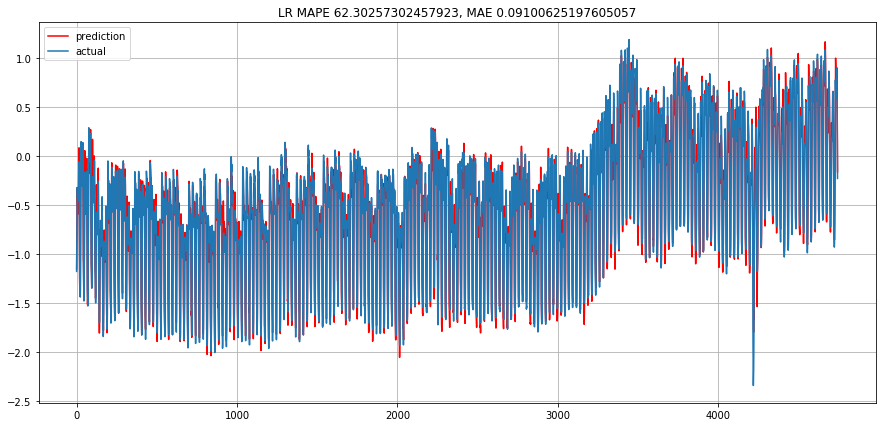

In [17]:
#Обучим на получившихся данных простую линейную регрессию.

from sklearn.linear_model import LinearRegression, Ridge, Lasso

lr = Ridge()
lr.fit(X_train, y_train)
prediction = lr.predict(X_test)
plt.figure(figsize=(15, 7))
plt.plot(prediction, "r", label="prediction")
plt.plot(y_test.values, label="actual")
plt.legend(loc="best")
plt.title("LR MAPE {}, MAE {}".format(mean_absolute_percentage_error(y_test,prediction),\
                                      mean_absolute_error(y_test,prediction)))
plt.grid(True);

In [19]:
# коэффициенты линейной регрессии
print(list(map(lambda x,y: [x,y], X_train.columns, np.round(lr.coef_,1))))

[['x_1', -0.1], ['x_2', -0.0], ['x_3', 0.0], ['lag_4', 1.3], ['lag_5', -0.8], ['lag_6', 0.1], ['lag_7', 0.2], ['lag_8', -0.0], ['lag_9', -0.2], ['lag_10', -0.1], ['lag_11', -0.0], ['lag_12', 0.1], ['lag_13', 0.1], ['lag_14', -0.0], ['lag_15', -0.1], ['lag_16', -0.0], ['lag_17', 0.1], ['lag_18', 0.0], ['lag_19', -0.0], ['lag_20', 0.0], ['lag_21', 0.0], ['lag_22', 0.0], ['lag_23', -0.1], ['lag_24', 0.7], ['lag_25', 0.0], ['lag_26', -0.0], ['lag_27', -0.1], ['lag_28', -1.0], ['lag_29', 0.6], ['lag_30', -0.0], ['lag_31', -0.2], ['lag_32', 0.0], ['lag_33', 0.2], ['lag_34', 0.1], ['lag_35', 0.0], ['lag_36', -0.1], ['lag_37', -0.1], ['lag_38', 0.0], ['lag_39', 0.1], ['lag_40', 0.0], ['lag_41', -0.1], ['lag_42', -0.0], ['lag_43', 0.0], ['lag_44', 0.0], ['lag_45', 0.0], ['lag_46', -0.1], ['lag_47', 0.1], ['is_weekend', -0.4], ['day_average', 0.2], ['weekday_average', -0.7], ['hour_average', 0.3], ['month_average', 0.1], ['year_average', -0.0]]


In [20]:
X_train.head()

,x_1,x_2,x_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,...,lag_44,lag_45,lag_46,lag_47,is_weekend,day_average,weekday_average,hour_average,month_average,year_average
0,1.251790,0.431465,-1.311174,-0.859568,-0.792245,-0.733322,-0.573817,-0.461007,-0.399917,-0.358055,...,-1.943523,-1.866146,-1.709298,-1.413909,0,-0.000311,0.108244,-0.159295,-0.869127,-0.140878
1,1.099175,0.448014,-1.117935,-0.843444,-0.859568,-0.792245,-0.733322,-0.573817,-0.461007,-0.399917,...,-2.037268,-1.943523,-1.866146,-1.709298,0,0.003639,0.155169,-0.492920,-0.869127,-0.140878
2,1.013329,0.464563,-1.012532,-0.820573,-0.843444,-0.859568,-0.792245,-0.733322,-0.573817,-0.461007,...,-2.115264,-2.037268,-1.943523,-1.866146,0,0.003639,0.155169,-0.700625,-0.869127,-0.140878
3,0.927483,0.481112,-0.907129,-0.807554,-0.820573,-0.843444,-0.859568,-0.792245,-0.733322,-0.573817,...,-2.048658,-2.115264,-2.037268,-1.943523,0,0.003639,0.155169,-0.804558,-0.869127,-0.140878
4,0.841637,0.497661,-0.801727,-1.001660,-0.807554,-0.820573,-0.843444,-0.859568,-0.792245,-0.733322,...,-1.897033,-2.048658,-2.115264,-2.037268,0,0.003639,0.155169,-0.862164,-0.869127,-0.140878


In [21]:
def performTimeSeriesCV(X_train, y_train, number_folds, model, metrics):
    print('Size train set: {}'.format(X_train.shape))

    k = int(np.floor(float(X_train.shape[0]) / number_folds))
    print('Size of each fold: {}'.format(k))

    errors = np.zeros(number_folds-1)

    # loop from the first 2 folds to the total number of folds    
    for i in range(2, number_folds + 1):
        print('')
        split = float(i-1)/i
        print('Splitting the first ' + str(i) + ' chunks at ' + str(i-1) + '/' + str(i) )

        X = X_train[:(k*i)]
        y = y_train[:(k*i)]
        print('Size of train + test: {}'.format(X.shape)) # the size of the dataframe is going to be k*i

        index = int(np.floor(X.shape[0] * split))

        # folds used to train the model        
        X_trainFolds = X[:index]        
        y_trainFolds = y[:index]

        # fold used to test the model
        X_testFold = X[(index + 1):]
        y_testFold = y[(index + 1):]

        model.fit(X_trainFolds, y_trainFolds)
        errors[i-2] = metrics(y_testFold,model.predict(X_testFold))

    # the function returns the mean of the errors on the n-1 folds    
    return errors.mean()

# 4.1 Линейная регрессия

In [22]:
%%time
performTimeSeriesCV(X_train, y_train, 5, lr, mean_absolute_percentage_error)

Size train set: (43136, 53)
Size of each fold: 8627

Splitting the first 2 chunks at 1/2
Size of train + test: (17254, 53)

Splitting the first 3 chunks at 2/3
Size of train + test: (25881, 53)

Splitting the first 4 chunks at 3/4
Size of train + test: (34508, 53)

Splitting the first 5 chunks at 4/5
Size of train + test: (43135, 53)
CPU times: user 237 ms, sys: 172 ms, total: 409 ms
Wall time: 193 ms


289.8117237389489

# 4.2 XGBOOST

In [383]:
import xgboost as xgb

def XGB_forecast(data, lag_start=5, lag_end=20, test_size=0.15, scale=1.96):

    # исходные данные
    X_train, X_test, y_train, y_test = prepareData(dataset, lag_start, lag_end, test_size)
    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test)

    # задаём параметры
    params = {
        'objective': 'reg:squarederror',
        'booster':'gblinear'
    }
    trees = 1000

    # прогоняем на кросс-валидации с метрикой rmse
    cv = xgb.cv(params, dtrain, metrics = ('rmse'), verbose_eval=False, nfold=10, show_stdv=False, num_boost_round=trees)

    # обучаем xgboost с оптимальным числом деревьев, подобранным на кросс-валидации
    bst = xgb.train(params, dtrain, num_boost_round=cv['test-rmse-mean'].argmin())

    # можно построить кривые валидации
    #cv.plot(y=['test-mae-mean', 'train-mae-mean'])

    # запоминаем ошибку на кросс-валидации
    deviation = cv.loc[cv['test-rmse-mean'].argmin()]["test-rmse-mean"]

    # посмотрим, как модель вела себя на тренировочном отрезке ряда
    prediction_train = bst.predict(dtrain)
    plt.figure(figsize=(15, 5))
    plt.plot(prediction_train)
    plt.plot(y_train)
    plt.axis('tight')
    plt.grid(True)

    # и на тестовом
    prediction_test = bst.predict(dtest)
    lower = prediction_test-scale*deviation
    upper = prediction_test+scale*deviation

    Anomalies = np.array([np.NaN]*len(y_test))
    Anomalies[y_test<lower] = y_test[y_test<lower]

    plt.figure(figsize=(15, 5))
    plt.plot(prediction_test, label="prediction")
    plt.plot(lower, "r--", label="upper bond / lower bond")
    plt.plot(upper, "r--")
    plt.plot(list(y_test), label="y_test")
    plt.plot(Anomalies, "ro", markersize=10)
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("XGBoost MAPE {}, MAE {}".format(mean_absolute_percentage_error(y_test,prediction_test),\
                                              mean_absolute_error(y_test,prediction_test)))
    plt.grid(True)
    plt.legend()

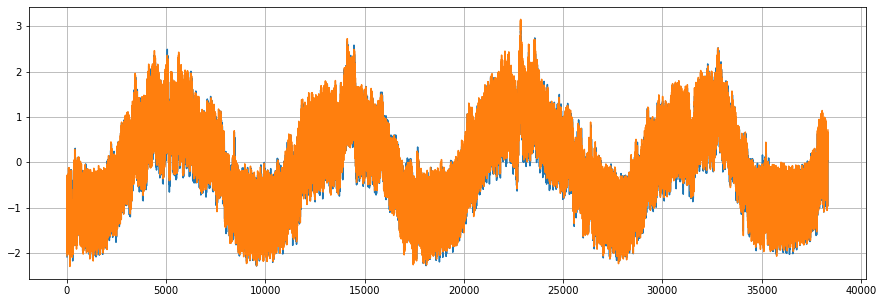

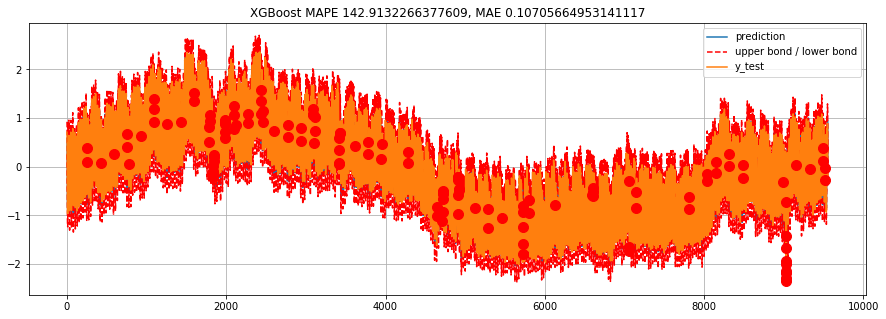

In [265]:
XGB_forecast(dataset, test_size=0.2, lag_start=5, lag_end=30)